<center><img src="assets/header.png"/></center>
<center>By the Lake, Christine Albao (2017)</center>

<p style="text-align: justify; font-size: 16px; line-height:30px">
&emsp; What happens when an artist's studio is invaded by lines of code? Can AI wield a painter's brush? This project is set to blur the lines, bringing together artists and algorithms in a daring dance of brushstrokes and codes. Join me in this mesmerizing journey where a traditional art form meets cutting-edge technology. We delve into the realms of Neural Style Transfer, a technique that merges the distinct styles of different artworks with unique subjects, breathing new life into both portraits and landscapes alike. Whether you're an artist seeking inspiration, a coder passionate about creative applications, or simply a curious mind, join us as we redefine the brush strokes of the future. This is not just about creating art; it's about breaking boundaries and reinventing artistic expression in the digital age.
</p>

***

<a name="top"></a>
## Table of Contents:

[ref0]: #Intro
- [Introduction and Motivation][ref0]

[ref1]: #NST
- [The Art of Neural Style Transfer (NST)][ref1]

[ref3]: #Setting_Up_Our_Canvas
- [Setting Up Our Canvas][ref3]

[ref4]: #Preparing_Our_Brushes
- [Preparing Our Brushes][ref4]

[ref5]: #Art_Studio
- [The Art Studio: Neural Style Transfer with VGG19][ref5]

[ref6]: #Masterpieces
- [AI-ssisted Masterpieces][ref6]

[ref7]: #New_Frontiers
- [New Frontiers][ref7]

[ref8]: #References
- [References][ref8]

***



<a name="Intro"></a>
<h1 style="color:#57A834">Why this Matters: The Intersection of Art and AI</h1>

<p style="text-align: justify; font-size: 16px; line-height:30px">
&emsp; Creativity has always been my second language, taking root from my artist father's inspirational work. From the rush of mixing colors on the palette to the gentle brushstrokes bringing life to a blank canvas, I found myself falling in love with the process.
</p>

<p style="text-align: justify; font-size: 16px; line-height:30px">
&emsp; My artistic style — vibrant and lively — draws its inspiration from the awe-striking beauty of nature. Parallel to this journey was an equally riveting exploration of the world of numbers. With a strong foundation in mathematics and a career in data science, I found another form of expression — through data and algorithms. This blend of creativity and technicality, of color palettes and data points, led me to a fascinating crossroads where <i><b>art meets artificial intelligence</b></i>.
</p>

<p style="text-align: justify; font-size: 16px; line-height:30px">
&emsp; As someone more at home painting landscapes, this project enables me to bring my style into an unfamiliar territory — portrait painting. But the implications of this project extend beyond my personal curiosity and exploration. It touches upon a significant discussion reverberating in the art world today — the role of AI in artistic creation. While some perceive AI as a threat, this project demonstrates that AI needn’t replace artists but can serve as a powerful ally. With Neural Style Transfer, for example, artists can experiment with their style in ways previously unimaginable, broadening their creative horizons.
</p>

<p style="text-align: justify; font-size: 16px; line-height:30px">
&emsp; It’s not about AI independently creating art but how it can contribute to an artist’s creative process. It could lead to exploring new subjects, help evolve an artist’s style, or push the boundaries of traditional forms and mediums. In this blog post, let’s illuminate the promising partnership between AI and artists together!
</p>

<a name="NST"></a>
<h1 style="color:#57A834">The Art of Neural Style Transfer (NST)</h1>

<p style="text-align: justify; font-size: 16px; line-height:30px">
&emsp; I've been mentioning this a few times already, but what exactly is Neural Style Transfer? Neural Style Transfer is a fascinating machine learning technique that blends the content of one image with the style of another. It's like creating a painting of a particular subject, but using the characteristic brushstrokes of a famous artist. This machine learning technique opened up a new world of possibilities when it was first introduced by Gatys et al., in their paper, "A Neural Algorithm of Artistic Style" in 2015.
</p>

<p style="text-align: justify; font-size: 16px; line-height:30px">
&emsp; In this blog, we use a specific variant of the Neural Style Transfer that leverages a pre-trained VGG19 model. VGG19 is a deep convolutional neural network, a popular model for image-related tasks, and it is pre-trained on a large dataset of images (ImageNet). With its 19 layers, VGG19 captures the minutiae of an image, making it the perfect instrument for our creative symphony. The lower layers detect edges and colors, while deeper layers could recognize more complex elements like shapes or even specific objects.
</p>

<a name="Setting_Up_Our_Canvas"></a>
<h1 style="color:#57A834">Setting Up Our Canvas</h1>

<p style="text-align: justify; font-size: 16px; line-height:30px">
&emsp; Now before we create our new art piece, we need the right tools, a clean canvas, and a well-lit space! Except, in our case, the tools are Python libraries, the canvas is your code editor, and the well-lit space is a well-configured computational environment.
</p>

<p style="text-align: justify; font-size: 16px; line-height:30px">
&emsp; As we dive into the artistry of code, we need to ensure we have all the necessary colors on our palette—or rather, all the essential libraries in our Python environment. This project uses libraries such as PIL for image handling, torch and torchvision for the neural network model, and matplotlib for plotting. The quickest way to install these is through pip, Python's package manager. To install these, type the following commands in your Jupyter Notebook cell or terminal:
</p>

In [ ]:
!pip install pillow
!pip install torch torchvision
!pip install matplotlib
!pip install glob2

<p style="text-align: justify; font-size: 16px; line-height:30px">
&emsp; With these installed, we're ready to get started! Here's a gist of what each part of the initial code does:
</p>

<ul style="text-align: justify; font-size: 16px; line-height:30px">
<li><b>os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'</b> is a workaround for a MacOS specific problem with some versions of the OpenMP library that might cause crashes. If you're not using MacOS, you may not need this line.</li>
    <li><b>os.environ['XDG_CACHE_HOME'] = '/Users/Ching/.cache'</b> and <b>os.environ['HUGGINGFACE_HUB_CACHE'] = '/Users/Ching/.cache'</b> are setting the cache directories for the environment. Replace <b>'/Users/Ching/.cache'</b> with your own preferred cache directory.</li>
<li><b>device = torch.device("cuda" if torch.cuda.is_available() else "cpu")</b> checks whether a GPU is available for computation. If a GPU is not available, computations will fall back on the CPU.</li>
</ul>

<p style="text-align: justify; font-size: 16px; line-height:30px">
&emsp; The dataset used for this project isn't a conventional dataset. You'll need two sets of images: content images (the images to which you want to transfer style) and style images (the images from which the style is extracted). In my case, I used portrait images as content images and my landscape paintings as style images which you may download from my <b>Github repository</b> linked below. If you want to explore other images and paintings, these can be easily obtained, even via a simple Google Image search. Once these are all set, we're ready to dive into the world of neural style transfer!
</p>

[GitHub Repository]((https://github.com/csalbao/Brushstrokes_and_Backpropagation))

In [2]:
import os

os.environ['KMP_DUPLICATE_LIB_OK'] = 'True'

# Local only (change to Jojie directory if needed)
os.environ['XDG_CACHE_HOME'] = '/Users/Ching/.cache'
os.environ['HUGGINGFACE_HUB_CACHE'] = '/Users/Ching/.cache'

In [3]:
import matplotlib.pyplot as plt
from PIL import Image 
import glob
from pathlib import Path

import torch
import torch.nn as nn
from torch import optim
import torch.nn.functional as F
import torchvision.transforms as transforms 
import torchvision.models as models 
from torchvision.utils import save_image 

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

<a name="Preparing_Our_Brushes"></a>
<h1 style="color:#57A834">Preparing Our Brushes</h1>

<p style="text-align: justify; font-size: 16px; line-height:30px">
&emsp; Our painting (or style transfer process) involves a series of repetitive steps. To save us from the tedious task of doing them manually each time, we prepare our tools in the form of Python functions. These helper functions are our secret weapons that help us apply the right technique with consistency.
</p>

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; The first function, <b>load_image</b>, acts as our initial brush stroke. It reads the image file from a provided path, resizes it if necessary (to ensure the computational resources aren't overwhelmed), and then applies transformations to turn our image into a tensor. This tensor is the format that our deep learning model will later understand and manipulate. However, the tensors our model will generate cannot be directly visualized by us mere mortals. Thus, we need a second function, <b>convert_image</b>, which serves as our display brush. It takes the processed tensor, undoes the normalization applied earlier, rearranges the dimensions, and clips the values to form a valid image format that we can display or save.
</p>

In [4]:
def load_image(img_path, max_size=512, shape=None):
    """
    Load an image and perform necessary transformations before passing to 
    the model.
    
    Parameters:
    img_path (str): Path of the image to be loaded.
    max_size (int, optional): Maximum size for the loaded image. 
                              Defaults to 400.
    shape (tuple, optional): Desired shape for the loaded image. 
                             Defaults to None.

    Returns:
    tensor: Transformed image tensor ready for model ingestion.
    """
    
    # Open the image using PIL
    image = Image.open(img_path)
    
    # Determine the size for resizing operation
    if max(image.size) > max_size or shape is not None:
        size = min(max_size, shape) if shape is not None else max_size
        
        # Compose the transforms - Resize, Convert to Tensor, Normalize
        in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])
        # Apply the transforms to the image
        image = in_transform(image)[:3,:,:].unsqueeze(0)
    else:
        # If no resizing is needed, just convert to Tensor and Normalize
        in_transform = transforms.Compose([
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406), 
                                             (0.229, 0.224, 0.225))])
        # Apply the transforms to the image
        image = in_transform(image)[:3,:,:].unsqueeze(0)

    return image

def convert_image(tensor):
    """
    Convert a PyTorch tensor into an image format that can be displayed.
    
    Parameters:
    tensor (tensor): PyTorch tensor representing an image.

    Returns:
    numpy.ndarray: Image in a displayable format.
    """
    # Move the tensor to CPU, clone and detach it
    image = tensor.to("cpu").clone().detach()
    
    # Convert the tensor to a numpy array and remove any unnecessary dimensions
    image = image.numpy().squeeze()
    
    # Reorder the dimensions from (channels, height, width) to (height, width, channels)
    image = image.transpose(1,2,0)
    
    # Denormalize the image data
    image = (image * np.array((0.229, 0.224, 0.225)) + 
             np.array((0.485, 0.456, 0.406)))
    
    # Clip the values to ensure they are all in the range 0-1
    image = image.clip(0, 1)

    return image

<a name="Art_Studio"></a>
<h1 style="color:#57A834">The Art Studio: Neural Style Transfer with VGG16</h1>

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; Let's step into the studio of our Neural Style Transfer process and unveil the magic behind each component. The first step of this process involves the <b>get_features</b> function. It's like the keen eye of an artist, scrutinizing the input images. It carefully examines the intricate details of both the content and style images, identifying key features that the neural network model can understand and utilize.
</p>

In [5]:
def get_features(image, model, layers=None):
    """
    Get features from an image at specified or default layers.
    
    Parameters:
    image (tensor): Image tensor from which to extract features.
    model (model): Model used for feature extraction.
    layers (dict, optional): Dictionary specifying which layers to extract 
        features from. Defaults to None.

    Returns:
    dict: Dictionary of features.
    """
    
    # Default layers for feature extraction
    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1', 
                  '10': 'conv3_1', 
                  '19': 'conv4_1',
                  '30': 'conv5_2', #content representation
                  '28': 'conv5_1'} #style representation
        
    # Dictionary to hold features
    features = {}
    x = image
    # Iterate over the layers in the model
    for name, layer in model._modules.items():
        x = layer(x)
        # Save the features of the specified layers
        if name in layers:
            features[layers[name]] = x
            
    return features

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; After that, we create a fucnion <b>gram_matrix</b>, which essentially captures the 'style' of the style image. It creates a representation, known as the Gram matrix, which encapsulates the textures, colors, and patterns, everything that makes the style unique.
</p>

In [6]:
def gram_matrix(tensor):
    """
    Calculate the Gram matrix of a tensor.
    
    Parameters:
    tensor (tensor): Input tensor.

    Returns:
    tensor: Gram matrix of the input tensor.
    """
    
    # Get the depth, height and width of the tensor
    _, d, h, w = tensor.size()
    
    # Reshape the tensor
    tensor = tensor.view(d, h * w)
    
    # Calculate the Gram matrix
    gm = torch.mm(tensor, tensor.t())
    
    return gm

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; Next, we introduce the AIrtist's hand, this function uses the details picked by <b>get_features</b> and the stylistic essence captured by <b>gram_matrix</b> to create a unique piece of art. Through a series of careful adjustments, it balances the form of the content image and the style of the style image to produce a result that beautifully merges the two. It takes the content and style images, transforms them into the feature space using our feature extractor, and then generates a new image that maintains the content of the content image but is 'painted' in the style of the style image. It does this by iteratively updating the new image to minimize a loss function that has two components: content loss and style loss.
</p>

In [7]:
def perform_nst(content, style, model, content_weight, style_weight,
                style_weights, epochs=5000, show_interval=1000,
                lr=0.01):
    """
    Perform style transfer on the provided content and style images.

    Parameters:
    content (tensor): The content image.
    style (tensor): The style image.
    model (model): The pretrained model used for feature extraction 
        (e.g., VGG19).
    content_weight (float): Weight for the content loss.
    style_weight (float): Weight for the style loss.
    style_weights (dict): Weights for the different layers when computing 
        the style loss.
    iterations (int, optional): Number of iterations for the optimization. 
        Defaults to 7000.
    show_interval (int, optional): Interval at which to show the current 
        output image. Defaults to 400.
    lr (float, optional): Learning rate for the optimizer. Defaults to 0.01.

    Returns:
    tensor: The final output image.
    """

    # Create a copy of the content image to modify
    target = content.clone().requires_grad_(True).to(device)

    # Use Adam optimizer for gradient descent
    optimizer = optim.Adam([target], lr=lr)

    # Extract features
    content_features = get_features(content, model)
    style_features = get_features(style, model)
    style_grams = {layer: gram_matrix(style_features[layer]) for layer
                   in style_features}

    for i in range(1, epochs+1):
        # Get the features of the target image
        target_features = get_features(target, model)

        # Compute the content loss
        content_loss = torch.mean((target_features['conv4_1'] -
                                   content_features['conv4_1'])**2)

        # Compute the style loss
        style_loss = 0
        for layer in style_weights:
            target_feature = target_features[layer]
            target_gram = gram_matrix(target_feature)
            _, d, h, w = target_feature.shape
            style_gram = style_grams[layer]
            layer_style_loss = (style_weights[layer] *
                                torch.mean((target_gram - style_gram)**2))
            style_loss += layer_style_loss / (d * h * w)

        # Compute the total loss
        total_loss = content_weight * content_loss + style_weight * style_loss

        # Perform backward propagation and optimization
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

    # Return the final output image
    return target

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; Finally, our <b>nst_pipeline</b> function acts as the curator of our gallery. It orchestrates the style transfer process for multiple pairs of content and style images, and stores the beautifully generated images for us to admire.
</p>

In [13]:
def nst_pipeline(content_image_paths, style_image_paths, model,
                 content_weight, style_weight, style_weights,
                 iterations=5000):
    """
    Perform style transfer on combinations of content and style images, and
    plot the results.

    Parameters:
    content_image_paths (list of str): Paths to the content images.
    style_image_paths (list of str): Paths to the style images.
    model (model): Pretrained model used for feature extraction (e.g., VGG19).
    content_weight (float): Weight for the content loss.
    style_weight (float): Weight for the style loss.
    style_weights (dict): Weights for the different layers when computing 
        the style loss.
    iterations (int, optional): Number of iterations for the optimization. 
        Defaults to 5000.
    """

    output_images = []

    for content_path in content_image_paths:
        for style_path in style_image_paths:
            print(f'Content: {content_path} | Style:{style_path} ')

            # Load the content and style images
            content = load_image(content_path).to(device)
            style = load_image(style_path).to(device)

            # Perform style transfer
            output = perform_nst(content, style, model,
                                 content_weight, style_weight,
                                 style_weights, iterations)

            # Convert tensor to image
            output_image = convert_image(output)
            plt.imsave(f'data/generated/{Path(content_path).stem}_{Path(style_path).stem}.jpeg',
                       output_image, dpi=300)

            # Store the output image
            output_images.append(output_image)

    return output_images

<a name="Masterpieces"></a>
<h1 style="color:#57A834">AI-ssisted Masterpieces</h1>

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; Now that we have everything prepared, it's time to let the magic of AI unfold! Again, we use the VGG19 model, a trained AIrtist that knows the essence of different styles and textures. We assure that the model's parameters, akin to an artist's individual technique, remain constant, enabling it to apply its knowledge without modifying its core understanding. We then ensure that our model operates on the device where we'll be running our computations;  in this case, we want it to be on our GPU
</p>

In [9]:
model = models.vgg19(weights=True).features

for param in model.parameters():
    param.requires_grad_(False)
    
model.to(device)

C:\Users\Ching\Anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; Next, we prepare our color palette by setting our <b>style_weights</b>. These weights dictate how much of each style layer should be used in our new artwork. The higher the weight, the stronger the influence of that layer, as if adding more of a specific color to our palette.
</p>

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; We then determine the relative importance of content and style for our image synthesis by setting the content_weight and <b>style_weight</b>. The <b>content_weight</b> (alpha) is the emphasis placed on matching the content image, and the <b>style_weight</b> (beta) is the emphasis on matching the style image. In other words, the content is like the sketch that guides the painting, and the style is the color scheme that defines its mood. Too much of one can overshadow the other, so this balance is vital to maintain.
</p>

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; The last step before we start is choosing our subjects (the content images) and deciding on the styles we want to mimic (the style images). Our style images vary from the swirling skies of Van Gogh, the tranquil scenes of Monet, the idyllic landscapes of Amorsolo, and some personal artworks that hold their unique charm.
</p>

In [15]:
style_weights = {'conv1_1': 1.5,
                 'conv2_1': 0.80,
                 'conv3_1': 0.25,
                 'conv4_1': 0.25,
                 'conv5_1': 0.25}

# Define the weights for the content and style loss
content_weight = 1e-2  # alpha
style_weight = 1e9     # beta

content_image_paths = glob.glob('data/content/*')[1:]
style_image_paths = ['data/style/vangogh1.jpeg',
                     'data/style/monet1.jpg',
                     'data/style/amorsolo1.jpg',
                     'data/style/ching8.JPG',
                     'data/style/ching4.JPG',
                     'data/style/ching5.JPG',
                     'data/style/ching6.JPG']

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; With the model, weights, and input images configured and prepared, we're all set to start the process of neural style transfer, blending the boundaries between traditional art and modern AI technology! 
</p>

In [9]:
generated_images = nst_pipeline(content_image_paths, style_image_paths, model,
                                content_weight, style_weight, style_weights,
                                iterations=5000)

Content: data/content\content2.JPG | Style:data/style/vangogh1.jpeg 
Content: data/content\content2.JPG | Style:data/style/monet1.jpg 
Content: data/content\content2.JPG | Style:data/style/amorsolo1.jpg 
Content: data/content\content2.JPG | Style:data/style/ching8.JPG 
Content: data/content\content2.JPG | Style:data/style/ching4.JPG 
Content: data/content\content2.JPG | Style:data/style/ching5.JPG 
Content: data/content\content2.JPG | Style:data/style/ching6.JPG 
Content: data/content\content3.jpg | Style:data/style/vangogh1.jpeg 
Content: data/content\content3.jpg | Style:data/style/monet1.jpg 
Content: data/content\content3.jpg | Style:data/style/amorsolo1.jpg 
Content: data/content\content3.jpg | Style:data/style/ching8.JPG 
Content: data/content\content3.jpg | Style:data/style/ching4.JPG 
Content: data/content\content3.jpg | Style:data/style/ching5.JPG 
Content: data/content\content3.jpg | Style:data/style/ching6.JPG 
Content: data/content\content4.JPG | Style:data/style/vangogh1.j

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; At this point in our exploration, we're ready to share the fruits of our labor. We've painstakingly prepped our canvas, mixed our digital paints, and set our AI artist loose with its brush. Now, we take a step back to appreciate its handiwork. First, we have a line-up of portraits, but not as we know them. These familiar faces have been reimagined through the styles of the great masters. Observe how the subtle hues, bold strokes, and unique textures that once graced famous canvases now come to life in these portraits, offering a fresh perspective on their identities.
</p>

In [17]:
def plot_images(content_image_paths, style_image_paths, generated_images, titles, figsize=(25, 35), wspace=0, hspace=0):
    """
    Plot content images, style images, and generated images in a grid.

    Parameters:
    content_image_paths (list of str): Paths to the content images.
    style_image_paths (list of str): Paths to the style images.
    generated_images (list of np.array): The generated images.
    """
    assert (len(content_image_paths) == len(generated_images) /
            len(style_image_paths)), "The number of generated images should be the product of the numbers of content and style images."
                                        

    rows = len(content_image_paths) + 1
    cols = len(style_image_paths) + 1

    fig, axes = plt.subplots(rows, cols, figsize=figsize)

    # Display style images
    for j, style_path in enumerate(style_image_paths, start=1):
        style_image = convert_image(load_image(style_path))
        axes[0, j].imshow(style_image)
        axes[0, j].set_title(titles[j-1], fontsize=16)

    # Display content and generated images
    for i, content_path in enumerate(content_image_paths, start=1):
        content_image = convert_image(load_image(content_path))
        axes[i, 0].imshow(content_image)

        for j in range(len(style_image_paths)):
            axes[i, j+1].imshow(generated_images[(i-1) *
                                len(style_image_paths)+j])

    # Hide axes
    for i in range(rows):
        for j in range(cols):
            axes[i, j].axis('off')

    plt.subplots_adjust(wspace=wspace, hspace=hspace)
    plt.savefig('data/grid.jpeg', bbox_inches='tight', dpi=200)
    plt.show()

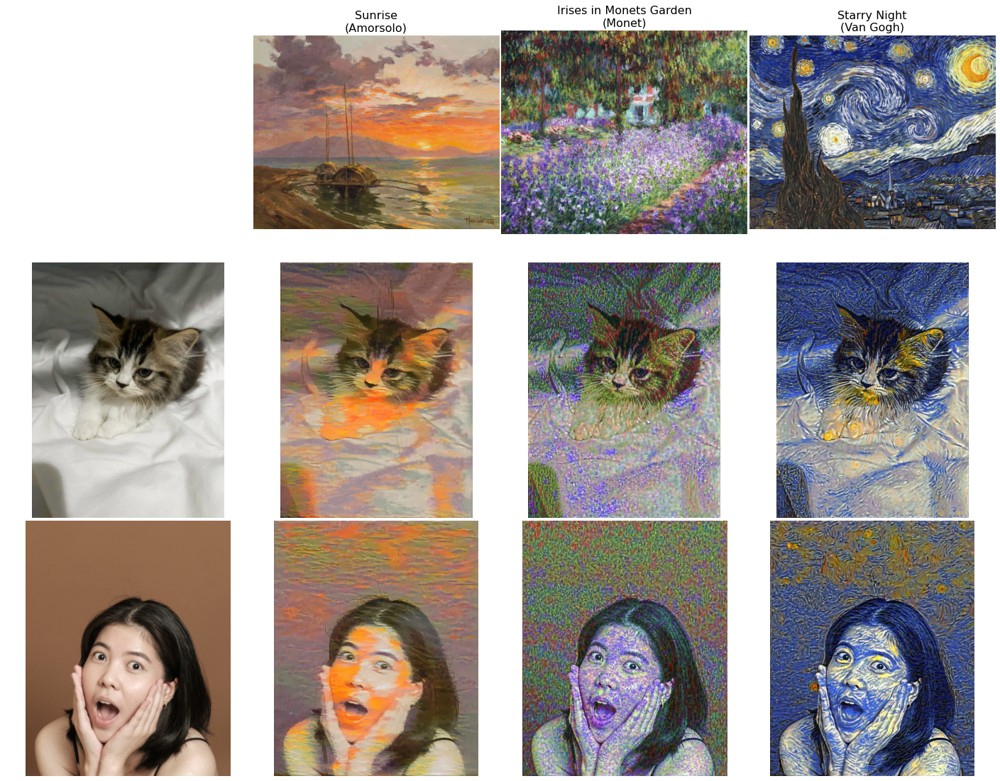

In [20]:
titles1 = ['Sunrise\n(Amorsolo)', 'Irises in Monets Garden\n(Monet)',
           'Starry Night\n(Van Gogh)']
gen_images1 = [convert_image(load_image(i))
               for i in glob.glob('data/generated/content[6-7]_a*')]
plot_images(['data/content/content6.JPG', 'data/content/content7.JPG'],
            ['data/style/amorsolo1.jpg',
             'data/style/monet1.jpg',
             'data/style/vangogh1.jpeg'], gen_images1,
            titles1, figsize=(25, 20), wspace=0.01, hspace=0.01)

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; Next, we take a personal turn using my artworks. With other subjects, our AI wields a different palette, one that reflects my individual artistic style. It's a thrilling experiment, watching an AI interpret my personal artistic sensibilities and applying them to these faces.
</p>

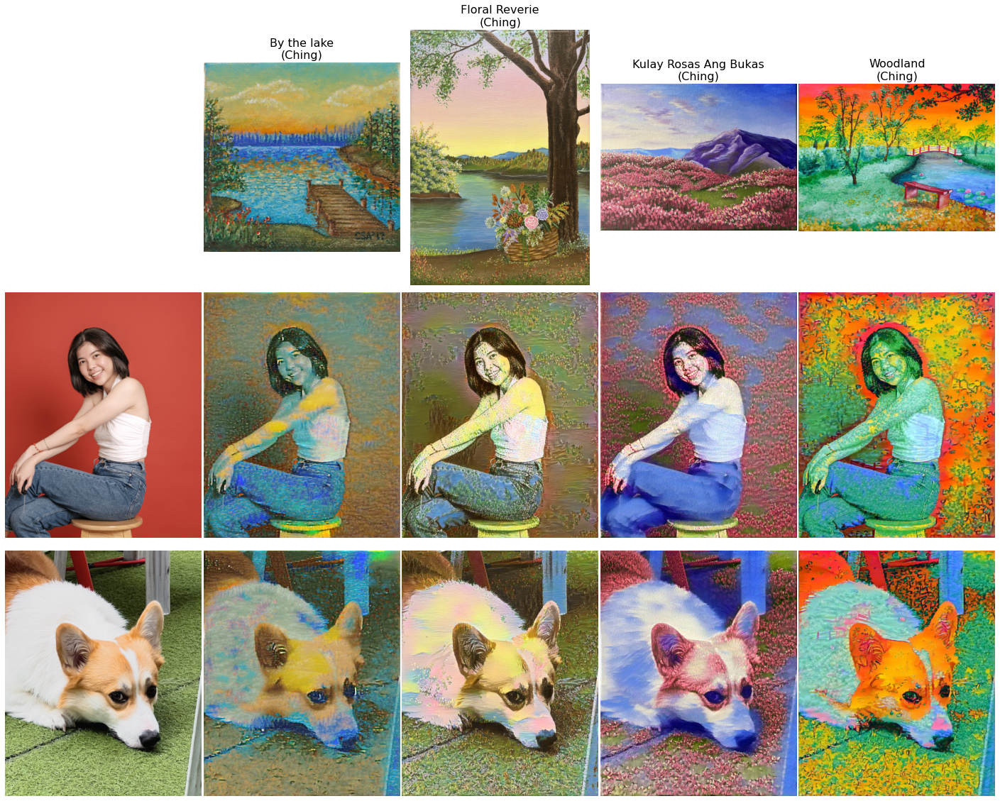

In [21]:
titles2 = ['By the lake\n(Ching)', 'Floral Reverie\n(Ching)', 
           'Kulay Rosas Ang Bukas\n(Ching)', 'Woodland\n(Ching)']
gen_images2 = [convert_image(load_image(i))
               for i in glob.glob('data/generated/content[4-5]_c*')]
plot_images(['data/content/content4.JPG', 'data/content/content5.JPG'],
            glob.glob('data/style/c*[4-6,8]*'), gen_images2,
            titles2, figsize=(25, 20), wspace=0.01, hspace=0.01)

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp;We unfold further to unveil a unique matrix of images, an expansive grid that captures every combination of subjects and styles. It's an exploration of the limitless possibilities that emerge when artistic nuances intertwine with machine learning algorithms.
</p>

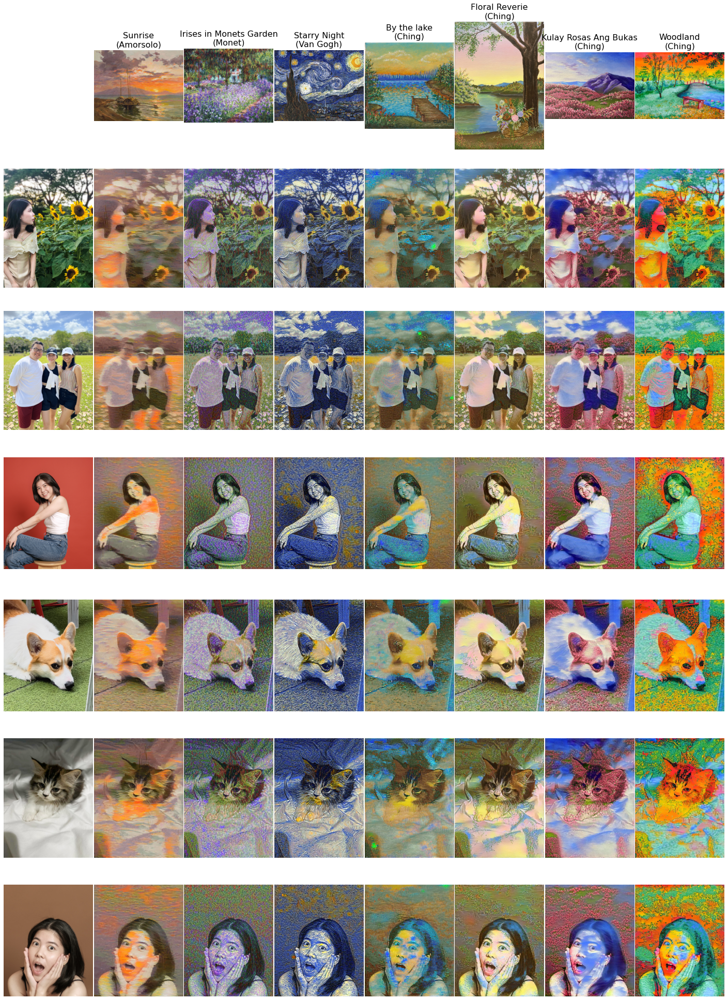

In [18]:
titles = ['Sunrise\n(Amorsolo)', 'Irises in Monets Garden\n(Monet)', 
          'Starry Night\n(Van Gogh)', 'By the lake\n(Ching)', 
          'Floral Reverie\n(Ching)', 'Kulay Rosas Ang Bukas\n(Ching)',
          'Woodland\n(Ching)']
content_image_paths = glob.glob('data/content/*[2-7]*')
style_image_paths = ['data/style/amorsolo1.jpg',
                     'data/style/monet1.jpg',
                     'data/style/vangogh1.jpeg',
                     'data/style/ching4.JPG',
                     'data/style/ching5.JPG',
                     'data/style/ching6.JPG',
                     'data/style/ching8.JPG']
generated_images = [convert_image(load_image(i))
                    for i in glob.glob('data/generated/[!l]*')]
plot_images(content_image_paths, style_image_paths,
            generated_images, titles, wspace=0.01, hspace=0.1)

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; Finally, we widen our scope, let's also try applying our landscape style to other landscapes as well! The essence of my artistry will breathe new life into these scenes, transforming everyday landscapes into vibrant works of art. Now, let's reveal these AI-generated images. Observe how style and subject interact, how they push and pull each other to form these unique pieces of art. This is not just about the end result, but the process and exploration that got us here.
</p>

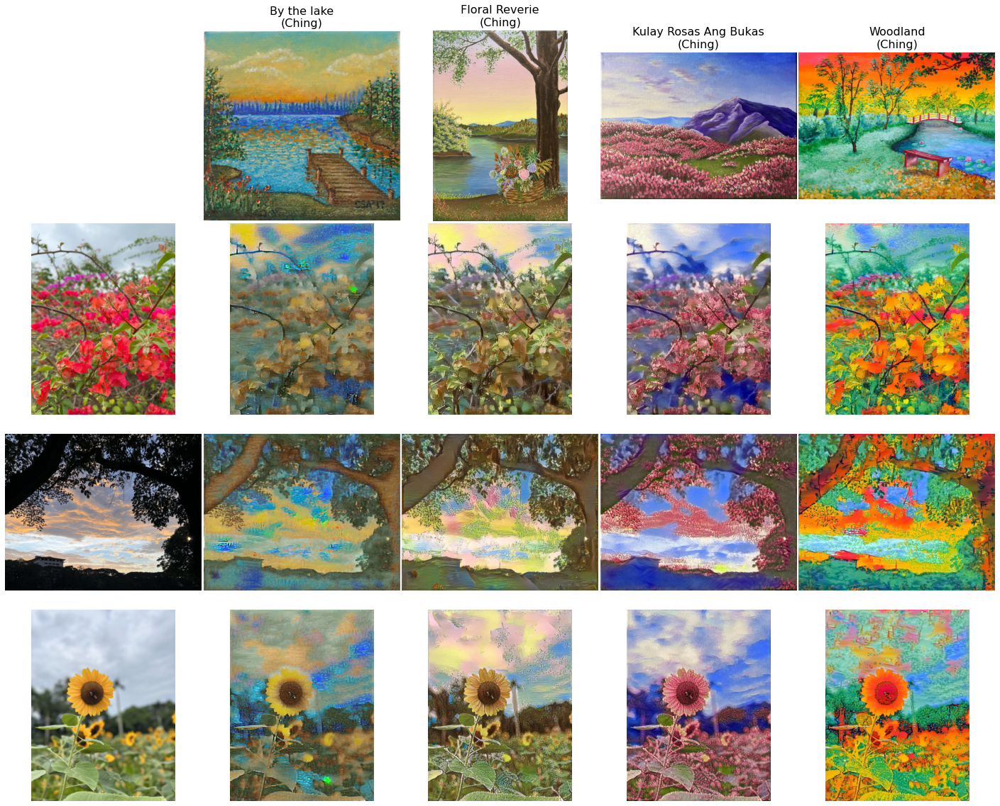

In [39]:
titles2 = ['By the lake\n(Ching)', 'Floral Reverie\n(Ching)',
           'Kulay Rosas Ang Bukas\n(Ching)', 'Woodland\n(Ching)']
gen_images3 = [convert_image(load_image(i))
               for i in glob.glob('data/generated/landscape/*')]
plot_images(glob.glob('data/content/*[8,9,10]*')[1:],
            glob.glob('data/style/c*[4-6,8]*'), gen_images3, titles2,
            figsize=(25, 20), wspace=0.01, hspace=0.01)

<a name="New_Frontiers"></a>
<h1 style="color:#57A834">New Frontiers</h1>

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; As we close the curtain on this exploration of neural style transfer, we can reflect on the successful fusion of diverse artistic styles onto fresh canvases. From the serene landscapes to the intense and expressive portraits, every subject bore witness to this harmonious blending of artistic genius and computational power.
</p>

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; Not every attempt hit the mark, and indeed, some of the transformed images may have fallen short of our artistic expectations. However, it is important to remember that even in the world of traditional art, not every brushstroke results in a masterpiece. It's in this iterative process of tweaking, the careful adjustment of the content and style weights, that we can refine and enhance our outputs. Just as a painter steps back, observes, and adjusts their approach, we too, in our algorithmic journey, learn and adapt.
</p>

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; Yet, what truly shines through in this exploration is the vast potential that lies at the intersection of AI and art. AI is more than just a tool—it's a collaborative partner, an entity that can learn, adapt, and even inspire. As artists, we can harness this potential to push the boundaries of creativity, breathe new life into our art.
</p>

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; AI and artists are not competitors but collaborators, both integral in their own ways to the art-making process. Together, they can unlock new artistic possibilities, encouraging us to question, reimagine, and redefine the meaning of art in this digital age. So as we step forward from this endeavor, let's remember this as a celebration of AI's transformative power, its potential to invigorate the canvas of digital art. Yet, it's also an affirmation of the irreplaceable spirit of human creativity—an ode to the enduring power of the artist's brushstroke, the lasting resonance of an evocative portrait, the timeless appeal of a masterfully painted landscape.
</p>

<p style="text-align: justify; font-size: 16px; line-height:30px">
    &emsp; The canvas, it seems, has merely expanded. Let us embrace this new frontier and continue to explore, create, and innovate at the confluence of art and AI.
</p>

<a name="References"></a>
<h1 style="color:#57A834">References</h1>

[1] Gatys, L. A., Ecker, A. S., & Bethge, M. (2015, September 2). A neural algorithm of artistic style. arXiv.org. https://arxiv.org/abs/1508.06576

[2] Singhal, G. (2020, June 9). Gaurav Singhal. Pluralsight. https://www.pluralsight.com/guides/artistic-neural-style-transfer-with-pytorch